From the iso-potential (ie iso-$\psi$) elliptical countours obtained with photutils we compare the evolution of axis ratio with radius and the other parameters, most importantly the drift ($\Delta x$, $\Delta y$) and the multipole parameters.

Here there is also a spinoff looking at the $\kappa$ map radial evolution, in particular related to the appearance of a central cusp, contrary to the previous result where only a core was visible. Reason being, that we are here looking at higher resolution kappa maps, where the central BH mass is somewhat resolved.

In [249]:
import numpy as np
from glob import glob
from copy import copy
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
%matplotlib inline

from python_tools.get_res import load_whatever

from nazgul.lib_plot import circle
from nazgul.pathfinder import tmp_dir
from nazgul.stat_lenses import get_all_gallens_paths
from nazgul.isocont_stat_plots import select_path_galaxies
from nazgul.pathfinder import get_lens_lowdir, std_sim,std_subsim,std_simsuite,std_data_dir

In [374]:
def get_lens(soap_index,snap,prj,
             sim=std_sim,subsim=std_subsim,simsuite=std_simsuite,data_dir=std_data_dir,verbose=True):
    
    gal_path = get_lens_lowdir(kw_gal={"soap_index":soap_index},
                               subdir="./",
                                snap=snap,
                                sim=sim,
                                subsim=subsim,
                                simsuite=simsuite,
                                data_dir=data_dir)

    gal_prj_nm = f"G{soap_index}_Prj{prj}"
    pth_to_find = f"{gal_path}/Sub_Lens_{gal_prj_nm}_*.pkl"
    find_path = glob(pth_to_find)
    if len(find_path)==1:
        pth = find_path[0]
    elif len(find_path)!=1:
        print(gal_path,pth_to_find)
        raise RuntimeError(f"Found {len(find_path)} lenses: {find_path}")
    lens = load_whatever(pth)
    lens.unpack(verbose=verbose)
    return lens
    
def get_gn_prj(gln):
    _gal_soap_n,_prj_i = gln.split("_prj")
    prj_i = _prj_i.replace(".dll","")
    gal_soap_n = str(Path(_gal_soap_n).parent.parent.name)
    return gal_soap_n.replace("Gn",""),prj_i

def get_DPA(isolist,i_tE):
    # get Pointing angle in degrees wrt PA at theta_E 
    pa     = isolist.pa/np.pi*180. # deg
    if np.any(np.abs(np.diff(pa))>135):
        pa[np.where(pa>135)] -=180
    pa_i = pa[i_tE]
    Dpa = pa-pa_i
    return Dpa

def get_xi_tE(isolist,RE_pix=1):
    """Get circularised radius from isolist, scaled by tE (given in pixel)"""
    q = 1-isolist.eps
    #b = isolist.sma*q
    xi = isolist.sma*np.sqrt(q) # = np.sqrt(a*b)
    xi_RE = xi/RE_pix
    return xi_RE

In [15]:

snaps     = ["0110"]
sim       = std_sim
subsim    = std_subsim
simsuite  = std_simsuite
reload    = False


gal_lenses_path = get_all_gallens_paths(snaps=snaps,
                                        simsuite=simsuite,
                                        sim=sim,
                                        subsim=subsim,
                                        data_dir=std_data_dir)
gal_path_sample = select_path_galaxies(gal_lenses_path=gal_lenses_path,number_gal=-1)


/cosma/home/do019/dc-quei1/nazgul/src/nazgul/isodens_stat_plots.py:32: UserWarning: For now very crude selection, just checks if the kappa isofit is present for the given galaxy
  warnings.warn("For now very crude selection, just checks if the kappa isofit is present for the given galaxy")


In [ ]:
# Find all previous iso-psi results
kw_isopsi_path_list = []
for gal_path in gal_path_sample:
    for glp in glob(gal_path+"/kw_res_isopsi_prj*"):
        kw_isopsi_path_list.append(glp)

Check the distribution of ellipticities for these results

In [388]:
eps_med = []
eps_tE  = []
for kw_iso_pth in kw_isopsi_path_list:
    kw_isopsi = load_whatever(kw_iso_pth)
    isolist = kw_isopsi["isofit"]["isolist"]
    # we skip the very first isophote
    isolist.__dict__["_list"] = isolist.__dict__["_list"][1:]
    gal_soap,prj = get_gn_prj(kw_iso_pth)
    lens   = get_lens(gal_soap,snaps[0],prj,verbose=False)
    RE_pix = lens.thetaE.value*lens.pixel_num/(2*lens.radius.value)
    sma_RE = isolist.sma/RE_pix
    i_01tE = np.argmin(np.abs(sma_RE-0.1))
    i_tE = np.argmin(np.abs(sma_RE-1))
    eps_med.append( np.median(isolist.eps[i_01tE:]))
    eps_tE.append( isolist.eps[i_tE])


Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
R

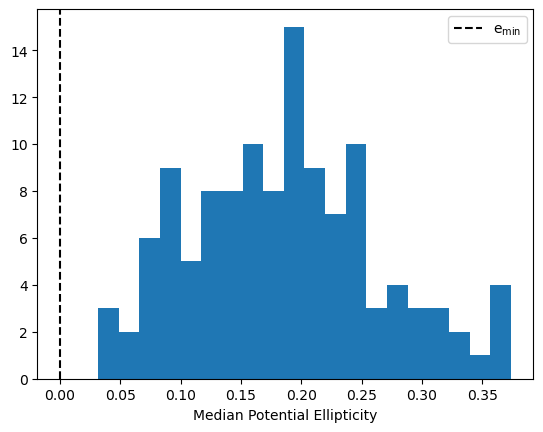

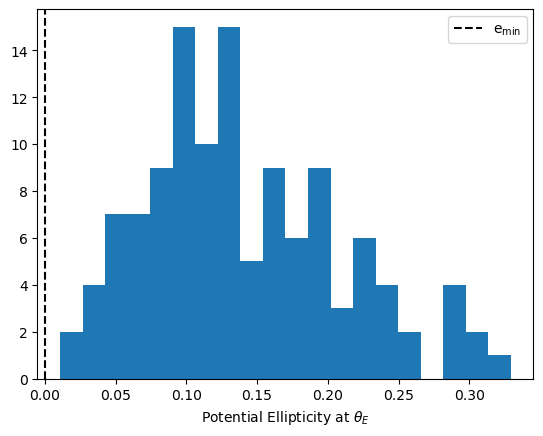

In [411]:
plt.hist(eps_med,bins=20)
plt.axvline(min_eps,label=r"e$_{\rm{min}}$",c="k",ls="--")
plt.xlabel("Median Potential Ellipticity")
plt.legend()
plt.show()
plt.hist(eps_tE,bins=20)
plt.axvline(min_eps,label=r"e$_{\rm{min}}$",c="k",ls="--")
plt.xlabel(r"Potential Ellipticity at $\theta_E$" )
plt.legend()
plt.show()

Running unpack silently...


/tmp/ipykernel_3354007/1250295369.py:142: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  lmy[0] -= dlmy
/tmp/ipykernel_3354007/1250295369.py:143: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  lmy[1] += dlmy
/tmp/ipykernel_3354007/1250295369.py:149: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axii.legend()


Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...


/tmp/ipykernel_3354007/1250295369.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axis = plt.subplots(5,2,figsize=(7,15))


Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
R

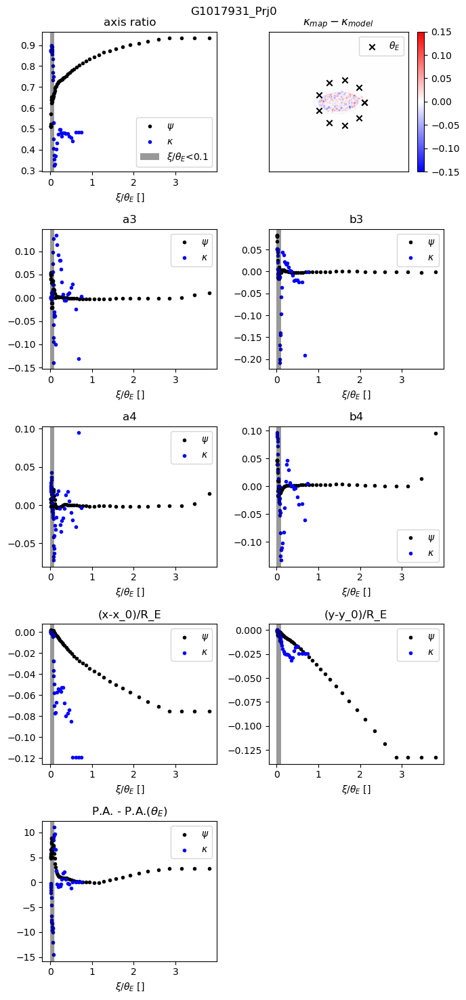

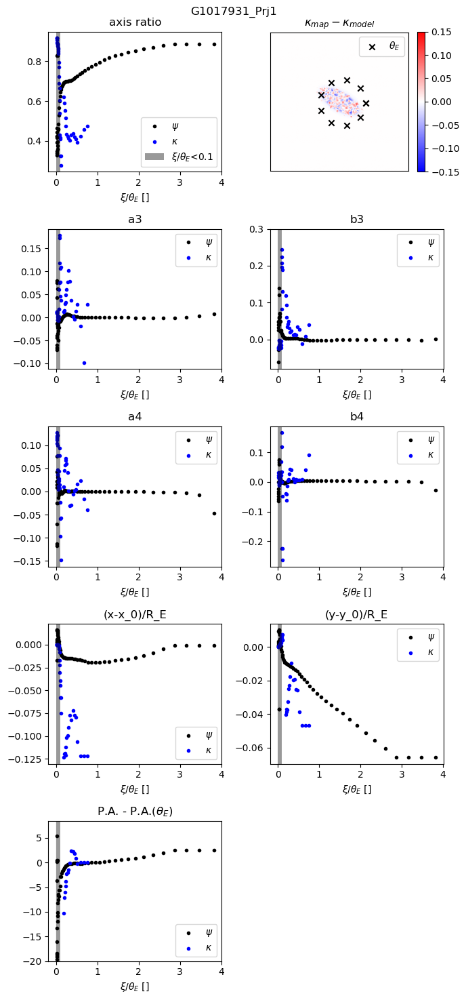

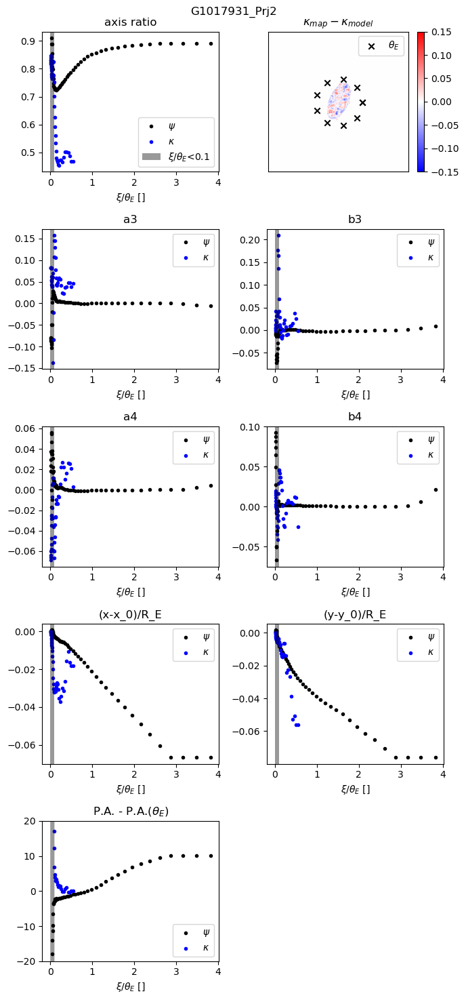

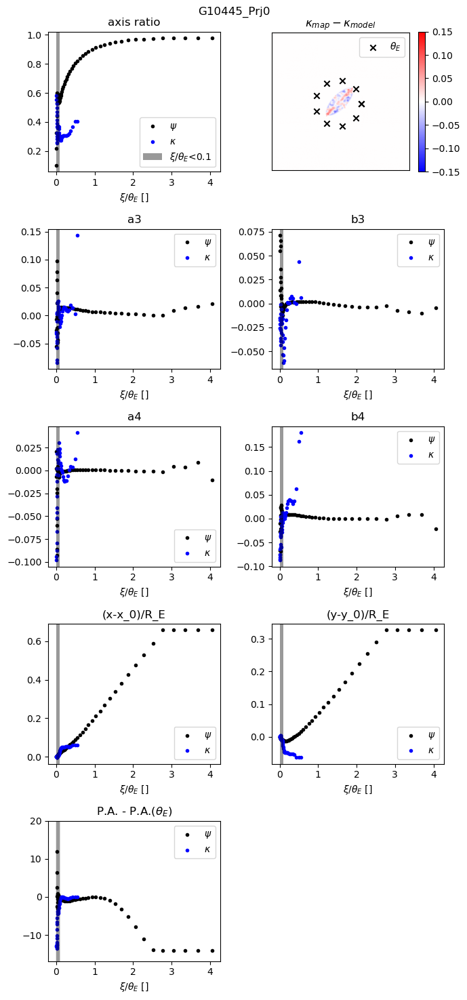

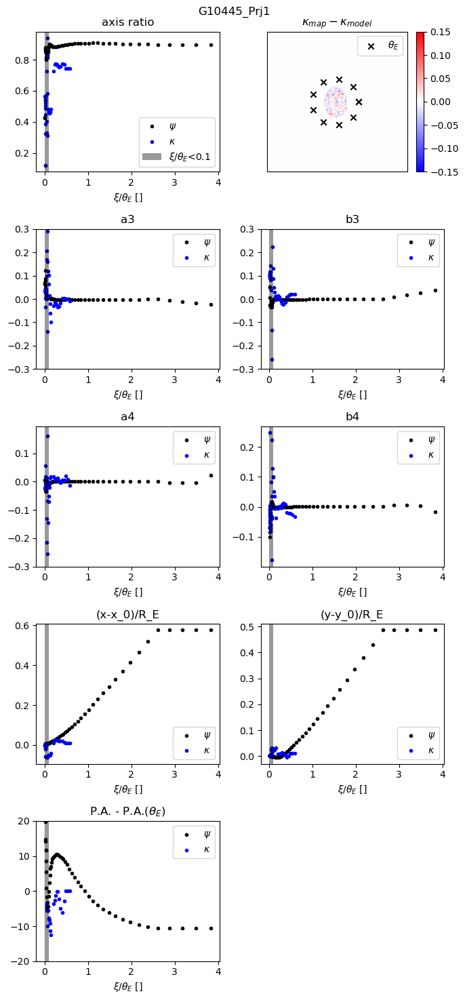

...

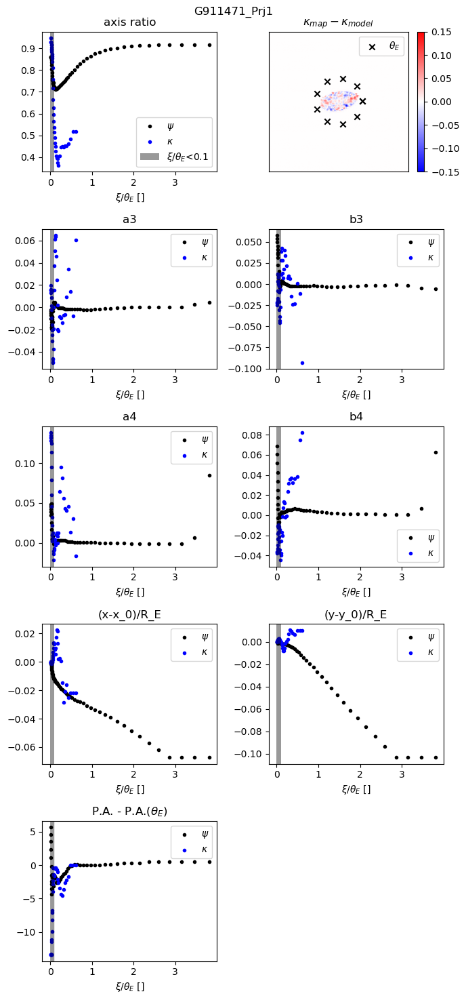

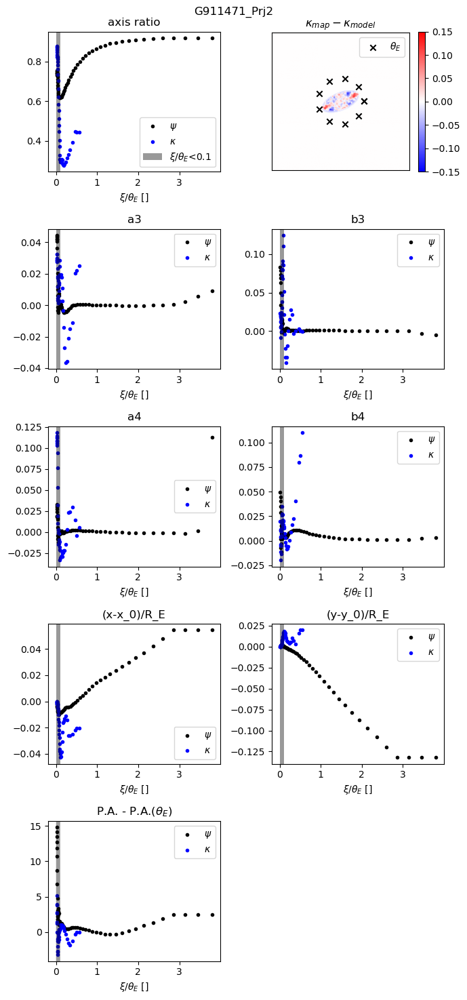

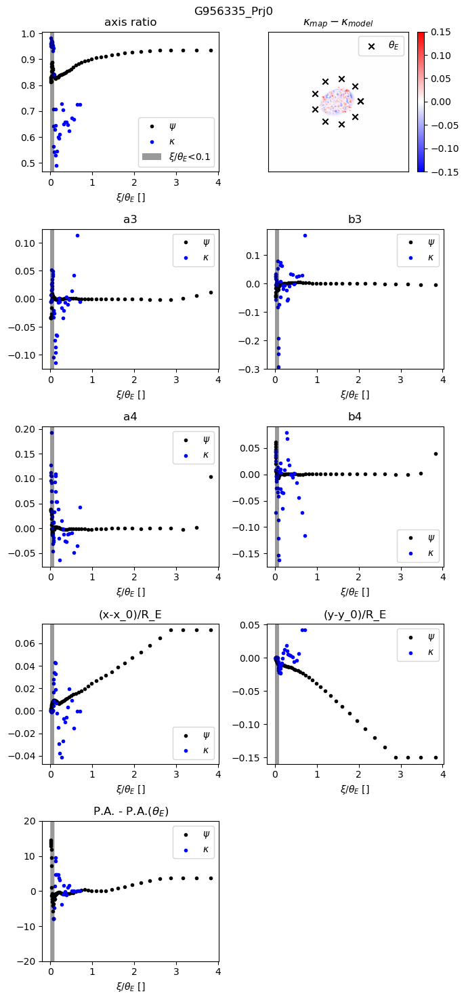

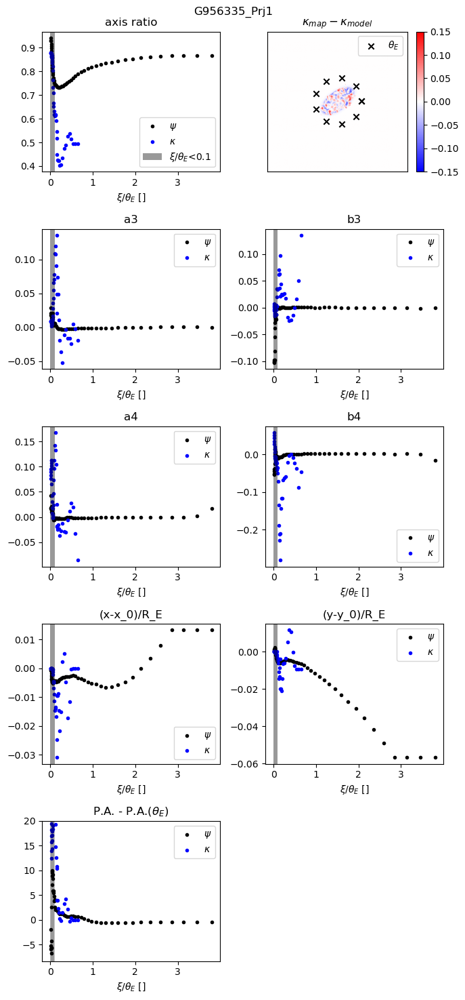

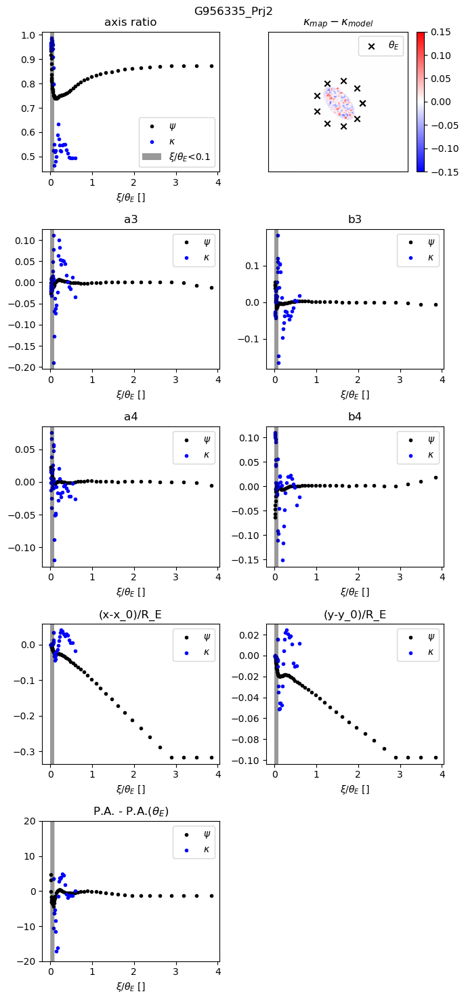

In [398]:
# if we want to define a cutoff for the ellipticity
min_eps = 0

# result path
pdf_path = tmp_dir/"compare_eps_m34_all.pdf"
with PdfPages(pdf_path) as pdf:
    for kw_iso_pth in kw_isopsi_path_list:
        kw_isopsi = load_whatever(kw_iso_pth)
        isolist = kw_isopsi["isofit"]["isolist"]
        # we skip the very first isophote
        isolist.__dict__["_list"] = isolist.__dict__["_list"][1:]
        gal_soap,prj = get_gn_prj(kw_iso_pth)
        lens   = get_lens(gal_soap,snaps[0],prj,verbose=False)
        RE_pix = lens.thetaE.value*lens.pixel_num/(2*lens.radius.value)
        sma_RE = isolist.sma/RE_pix
        i_01tE = np.argmin(np.abs(sma_RE-0.1))
        i_tE   = np.argmin(np.abs(sma_RE-1))
        if np.median(isolist.eps[i_01tE:])>min_eps:    
            
            fig,axis = plt.subplots(5,2,figsize=(7,15))
            fig.suptitle(lens.name.replace("Sub_Lens_",""))
            q     = 1-isolist.eps
            xi_RE = get_xi_tE(isolist,RE_pix)
            ax = axis[1][0]
            #ax.scatter(sma_RE,isolist.a3,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,isolist.a3,marker=".",c="k",label=r"$\psi$")
            ax.set_title("a3")
            
            ax = axis[1][1]
            #ax.scatter(sma_RE,isolist.b3,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,isolist.b3,marker=".",c="k",label=r"$\psi$")
            ax.set_title("b3")
            
            ax = axis[2][0]
            #ax.scatter(sma_RE,isolist.a4,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,isolist.a4,marker=".",c="k",label=r"$\psi$")
            ax.set_title("a4")
            
            ax = axis[2][1]
            #ax.scatter(sma_RE,isolist.b4,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,isolist.b4,marker=".",c="k",label=r"$\psi$")
            ax.set_title("b4")
    
            ax = axis[3][0]
            #ax.scatter(sma_RE,(isolist.x0-isolist.x0[0])/RE_pix,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,(isolist.x0-isolist.x0[0])/RE_pix,marker=".",c="k",label=r"$\psi$")
            ax.set_title("(x-x_0)/R_E")
            
            ax = axis[3][1]
            #ax.scatter(sma_RE,(isolist.x0-isolist.x0[0])/RE_pix,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,(isolist.y0-isolist.y0[0])/RE_pix,marker=".",c="k",label=r"$\psi$")
            ax.set_title("(y-y_0)/R_E")
    
            ax = axis[0][0]
            #ax.scatter(sma_RE,isolist.eps,marker=".",c="k",label=r"$\psi$")
            ax.scatter(xi_RE,q,marker=".",c="k",label=r"$\psi$")
            ax.set_title("axis ratio")
            
            ax = axis[4][0]
            dPA  = get_DPA(isolist,i_tE)
            ax.scatter(xi_RE,dPA,marker=".",c="k",label=r"$\psi$")
            ax.set_title(r"P.A. - P.A.($\theta_E$)")

            #ax = axis[4][1]
            #ax.scatter(xi_RE,isolist.intens,marker=".",c="k",label=r"-$\psi$+k")
            #ax.set_title(r"f($\xi/\theta_E$) for $\psi$ and $\kappa$")
            
            ax = axis[0][1]
            try:
                kw_isodens = load_whatever(kw_iso_pth.replace("isopsi","isodens"))
                isolist_dens = kw_isodens["isofit"]["isolist"]
                isolist_dens.__dict__["_list"] = isolist_dens.__dict__["_list"][1:]

                kappa_res    = kw_isodens["isofit"]["map"]-kw_isodens["isofit"]["model"]
                vm = 0.15
                im = ax.imshow(kappa_res,cmap="bwr",vmin=-vm,vmax=+vm)
                ax.scatter(*circle(isolist_dens.x0[0],isolist_dens.y0[0],RE_pix,n_points=10),c="k",marker="x",label=r"$\theta_E$")
                ax.set_title(r"$\kappa_{map}-\kappa_{model}$")
                fig.colorbar(im)
                q_dens     = 1-isolist_dens.eps
                xi_dens_RE = get_xi_tE(isolist_dens,RE_pix)
                ###
                ax = axis[1][0]
                #ax.scatter(sma_dens_RE,isolist_dens.a3,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,isolist_dens.a3,marker=".",c="b",label=r"$\kappa$")
                ax = axis[1][1]
                #ax.scatter(sma_dens_RE,isolist_dens.b3,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,isolist_dens.b3,marker=".",c="b",label=r"$\kappa$")
                ax = axis[2][0]
                #ax.scatter(sma_dens_RE,isolist_dens.a4,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,isolist_dens.a4,marker=".",c="b",label=r"$\kappa$")
                ax = axis[2][1]
                #ax.scatter(sma_dens_RE,isolist_dens.b4,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,isolist_dens.b4,marker=".",c="b",label=r"$\kappa$")
                ax = axis[0][0]
                #ax.scatter(sma_dens_RE,isolist_dens.eps,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,q_dens,marker=".",c="b",label=r"$\kappa$")
                
                ax = axis[3][0]
                #ax.scatter(sma_dens_RE,(isolist_dens.x0-isolist_dens.x0[0])/RE_pix,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,(isolist_dens.x0-isolist_dens.x0[0])/RE_pix,marker=".",c="b",label=r"$\kappa$")
                ax = axis[3][1]
                #ax.scatter(sma_dens_RE,(isolist_dens.y0-isolist_dens.y0[0])/RE_pix,marker=".",c="b",label=r"$\kappa$")
                ax.scatter(xi_dens_RE,(isolist_dens.y0-isolist_dens.y0[0])/RE_pix,marker=".",c="b",label=r"$\kappa$")
    
                ax = axis[4][0]
                i_tE_dens = np.argmin(np.abs(xi_dens_RE-1))
                Dpa_dens = get_DPA(isolist_dens,i_tE_dens)
                ax.scatter(xi_dens_RE,Dpa_dens,marker=".",c="b",label=r"$\kappa$")
                ax.set_title(r"P.A. - P.A.($\theta_E$)")

                # forget about this - this analysis was run to study the shape not the actual value of kappa 
                #-> it was run on a smoothed and log-scaled version of it
                #ax = axis[4][1]
                #ax.scatter(xi_dens_RE,isolist_dens.intens,marker=".",c="b",label=r"$\kappa$")

            except FileNotFoundError:
                pass

            # limit the a3,b3,a4,b4
            for axi in axis[1],axis[2]:
                for ax in axi:
                    min_y,max_y = ax.get_ylim()
                    if min_y<-.3:
                        min_y=-.3
                    if max_y>.3:
                        max_y=.3
                    ax.set_ylim(min_y,max_y)
            for i,axi in enumerate(axis):
                for j,axii in enumerate(axi):
                    #_,max_x = axii.get_xlim()
                    #axii.set_xlim(0.1,max_x)
                    if i!=0 or j!=1: # the image
                        axii.set_xlabel(r"$\xi/\theta_E$ []")
                        lbl = None
                        if i==0 and j==0:
                            lbl = r"$\xi/\theta_E$<0.1"
                        orig_lmy = np.array(axii.get_ylim())
                        lmy     = copy(orig_lmy)
                        dlmy   =  np.abs(np.diff(orig_lmy))*.3
                        lmy[0] -= dlmy
                        lmy[1] += dlmy
                        axii.fill_betweenx(np.arange(*lmy,0.01),0.1,facecolor="k",alpha=.4,label=lbl)
                        axii.set_ylim(*orig_lmy)
                    else:
                        axii.set_xticks([])
                        axii.set_yticks([])
                    axii.legend()
            for ax in [axis[4][0]]:
                min_y,max_y = ax.get_ylim()
                if min_y<-20:
                    min_y=-20
                if max_y>20:
                    max_y=20
                ax.set_ylim(min_y,max_y)
            axis[-1][-1].remove()
            fig.tight_layout()
            pdf.savefig(fig)
            #plt.show()

Intensity is the fitted value of the elliptical iso-contour at a certain semi-major axis a (variable called sma). Remember however that this was fitted over a "rescale_kappa" map (see nazgul.isodens). This mean mainly that it is 
- smoothed
- cropped
- log-scaled
  
Most importantly, it's the smoothing (as the log can be corrected for and the crop only affects individual pixels):


#plt.hist(np.reshape(lens.kappa_map,200*200),bins=100)
isodens_map = kw_isodens["isofit"]["map"]
isodens_model = kw_isodens["isofit"]["model"]


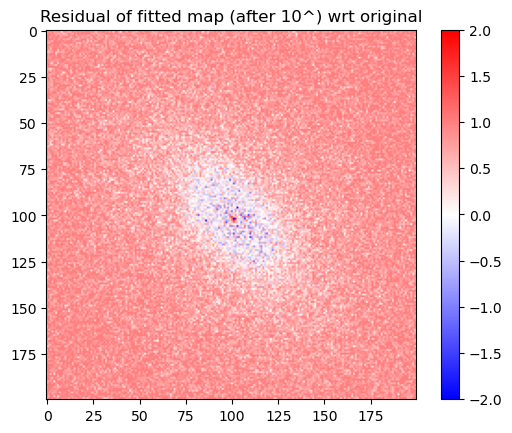

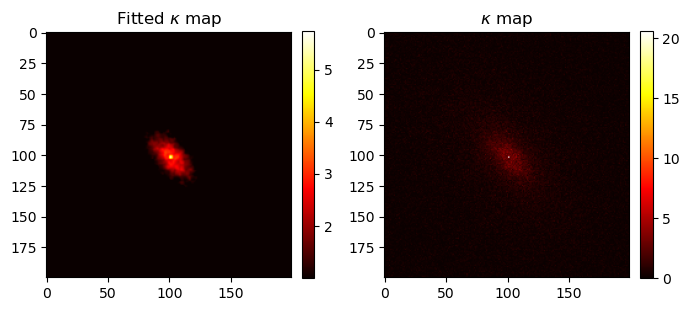

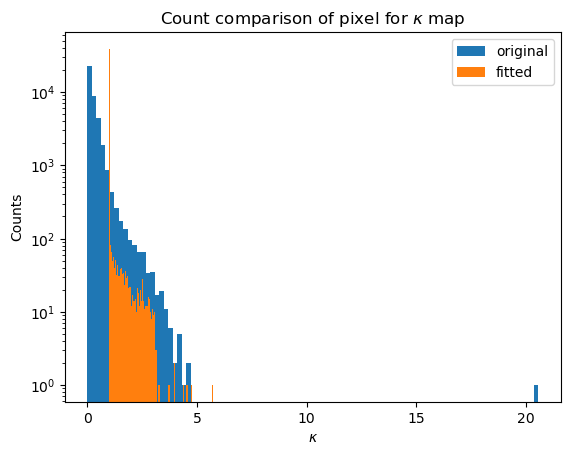

In [402]:
plt.title("Residual of fitted map (after 10^) wrt original")
plt.imshow((10**kw_isodens["isofit"]["map"])+1e-6-lens.kappa_map,cmap="bwr",vmin=-2,vmax=2)
plt.colorbar()
plt.show()
fig,ax = plt.subplots(1,2,figsize=(7,7))
im = ax[0].imshow(((10**kw_isodens["isofit"]["map"])+1e-6),cmap="hot")
ax[0].set_title(r"Fitted $\kappa$ map")
fig.colorbar(im, fraction=0.046, pad=0.04)
im = ax[1].imshow(lens.kappa_map,cmap="hot")
ax[1].set_title(r"$\kappa$ map")
fig.colorbar(im, fraction=0.046, pad=0.04)
fig.tight_layout()
plt.show()
plt.title(r"Count comparison of pixel for $\kappa$ map")
plt.hist(np.reshape(lens.kappa_map,200*200),bins=100,label="original")
plt.hist(np.reshape(10**isodens_map,200*200),bins=100,label="fitted")
plt.yscale("log")
plt.xlabel(r"$\kappa$")
plt.ylabel(r"Counts")
plt.legend()
plt.show()



Then we convert the sma in $\xi=\sqrt{ab}$ and normalise by $\theta_E$.

So the 1D plot is $\kappa(\xi/\theta_E)$.

Studying /cosma/home/do019/dc-quei1/nazgul/src/nazgul/RingBearer/COLIBRE/L0050N0752/THERMAL_AGN_m6/snap_0110/Gn956335/Sub/kw_res_isopsi_prj2.dll
Running unpack silently...


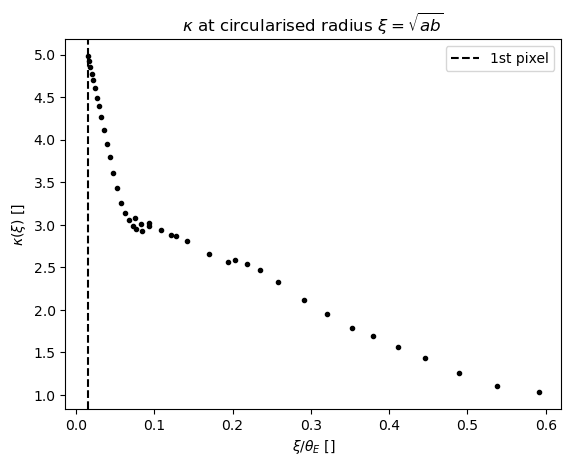

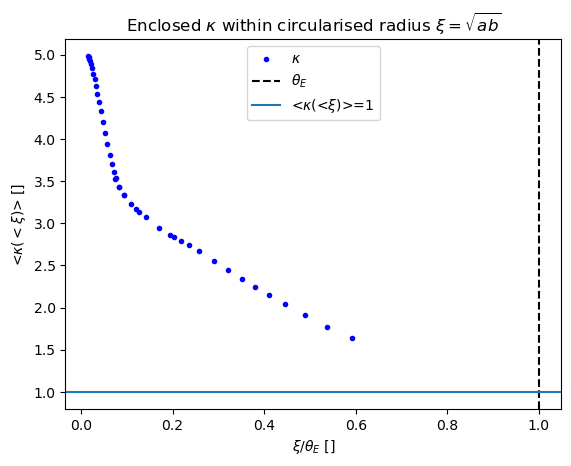

In [404]:
print(f"Studying {kw_iso_pth}")
gal_soap,prj = get_gn_prj(kw_iso_pth)
lens    = get_lens(gal_soap,snaps[0],prj,verbose=False)
arc2pix = lens.pixel_num/(2*lens.radius.value)
RE_pix  = lens.thetaE.value*arc2pix
kw_isodens = load_whatever(kw_iso_pth.replace("isopsi","isodens"))
isolist_dens = kw_isodens["isofit"]["isolist"]
isolist_dens.__dict__["_list"] = isolist_dens.__dict__["_list"][1:]


_q_dens   = 1-isolist_dens.eps 
_xi_dens  = isolist_dens.sma*np.sqrt(_q_dens)
A         = np.pi*_xi_dens**2
dA        = np.diff(np.concatenate(([0.0], A)))     # area of each annulus
plt.scatter(_xi_dens/RE_pix,10**(isolist_dens.intens),c="k",marker=".")
plt.axvline(.5/RE_pix,label="1st pixel",ls="--",c="k")
plt.xlabel(r"$\xi/\theta_E$ []")
plt.ylabel(r"$\kappa(\xi)$ []")
plt.title(r"$\kappa$ at circularised radius $\xi=\sqrt{ab}$")
plt.legend()
plt.show()
kappa     = 10**isolist_dens.intens
f_avg     = np.cumsum(kappa *dA) / A  

plt.scatter(_xi_dens/RE_pix,f_avg,marker=".",c="b",label=r"$\kappa$")
plt.xlabel(r"$\xi/\theta_E$ []")
plt.ylabel(r"<$\kappa(<\xi)$> []")
plt.title(r"Enclosed $\kappa$ within circularised radius $\xi=\sqrt{ab}$")
plt.axvline(1,label=r"$\theta_E$",ls="--",c="k")
plt.axhline(1,label=r"<$\kappa$(<$\xi$)>=1")
plt.legend()
plt.show()

Proof that the integration done this way is a valid approximation:

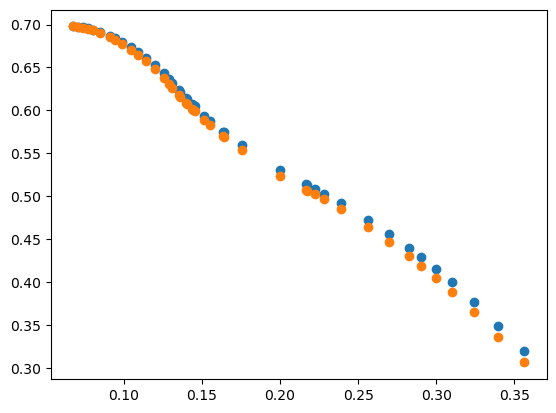

In [407]:
import numpy as np
from scipy.integrate import cumulative_trapezoid

q   = 1 - isolist_dens.eps                     # axis ratio b/a
smb = isolist_dens.sma * q
xi  = np.sqrt(sma * smb)*pix2arc # = sma * sqrt(q)

order = np.argsort(xi)
xi_s, f_s = xi[order], isolist_dens.intens[order]

g = f_s * xi_s
xi0 = np.concatenate(([0.0], xi_s))     # anchor the integral at the center
g0  = np.concatenate(([0.0], g))

I = cumulative_trapezoid(g0, xi0, initial=0.0)[1:]
f_enclosed = 2 * I / xi_s**2            # <f>(<xi_s), same ordering as xi_s
plt.scatter(xi_s,f_enclosed)
#plt.axvline(lens.thetaE.value)


A = np.pi*(xi_s)**2
dA = np.diff(np.concatenate(([0.0], A)))     # area of each annulus
f_avg = np.cumsum(f_s * dA) / A  
plt.scatter(xi_s,f_avg)
#plt.axvline(lens.thetaE.value)
plt.show()

We indeed do not reach $\theta_E$ with the fit, especially when taking the circularised radius

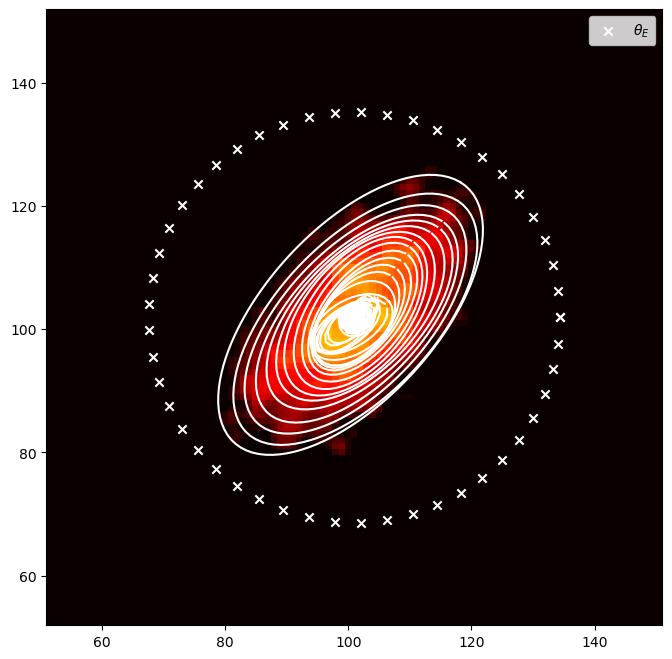

In [408]:
fig, ax = plt.subplots(figsize=(8, 8))
isolist_dens = kw_isodens["isofit"]["isolist"]
isolist_dens.__dict__["_list"] = isolist_dens.__dict__["_list"][1:]
isodens_map = kw_isodens["isofit"]["map"]

ax.imshow(isodens_map,origin="lower",cmap="hot")
isos = []

smas = isolist_dens.sma  
for sma in smas:
    iso = isolist_dens.get_closest(sma)
    isos.append(iso)
    x, y, = iso.sampled_coordinates()
    plt.plot(x, y, color='white')
iso = isos[0]
x0,y0 = iso.x0,iso.y0
plt.scatter(*circle(x0,y0,r=RE_pix),c="w",marker="x",label=r"$\theta_E$")
plt.xlim(x0-50,x0+50)
plt.ylim(y0-50,y0+50)
plt.legend()

Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
Running unpack silently...
R

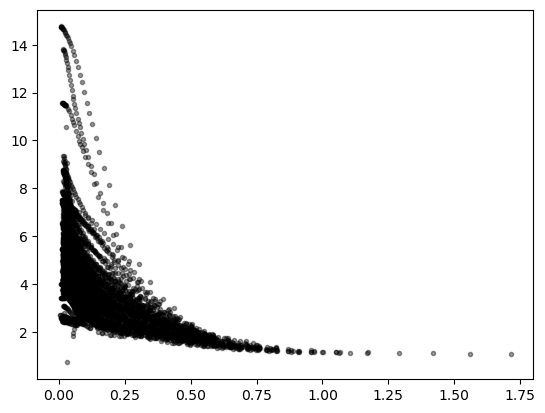

In [410]:
for kw_iso_pth in kw_isopsi_path_list:
    gal_soap,prj = get_gn_prj(kw_iso_pth)
    # we skip the very first isophote
    lens = get_lens(gal_soap,snaps[0],prj,verbose=False)
    kw_isodens = load_whatever(kw_iso_pth.replace("isopsi","isodens"))
    isolist_dens = kw_isodens["isofit"]["isolist"]
    isolist_dens.__dict__["_list"] = isolist_dens.__dict__["_list"][1:]
    RE_pix = lens.thetaE.value*lens.pixel_num/(2*lens.radius.value)
    q_dens       = 1 - isolist_dens.eps
    xi_dens    = isolist_dens.sma*np.sqrt(q_dens)
    xi_dens_RE = xi_dens/RE_pix
    
    q_dens   = 1-isolist_dens.eps 
    xi_dens  = isolist_dens.sma*np.sqrt(q_dens)
    A         = np.pi*xi_dens**2
    dA        = np.diff(np.concatenate(([0.0], A)))     # area of each annulus
    kappa     = 10**isolist_dens.intens
    f_avg     = np.cumsum(kappa *dA) / A  
    plt.scatter(xi_dens_RE,f_avg,c="k",alpha=.4,marker=".")